<a href="https://colab.research.google.com/github/guilherme-vaz/ML-MelbournHouses-Study/blob/master/Base_profile_Melbourn_Houses.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pandas_profiling

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
base = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Datasets/melb_data.csv')

In [8]:
profile = ProfileReport(base)

In [9]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
# Retirando as colunas que tiveram uma alta cardinalidade
base = base.drop(["Suburb", "Address", "SellerG", "Date"], axis=1)

In [11]:
# Retirando colunas com mais de 20% de valores nulos
base = base.drop(["BuildingArea", "YearBuilt"], axis=1)

In [12]:
# Visualizando a base restante
base.head()

,Rooms,Type,Price,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,2,h,1480000.0,S,2.5,3067.0,2.0,1.0,1.0,202.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,2,h,1035000.0,S,2.5,3067.0,2.0,1.0,0.0,156.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,3,h,1465000.0,SP,2.5,3067.0,3.0,2.0,0.0,134.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,3,h,850000.0,PI,2.5,3067.0,3.0,2.0,1.0,94.0,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,4,h,1600000.0,VB,2.5,3067.0,3.0,1.0,2.0,120.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


<ipython-input-14-fd79c1dc47bc>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(base.corr(),annot=True,cmap="YlGnBu")


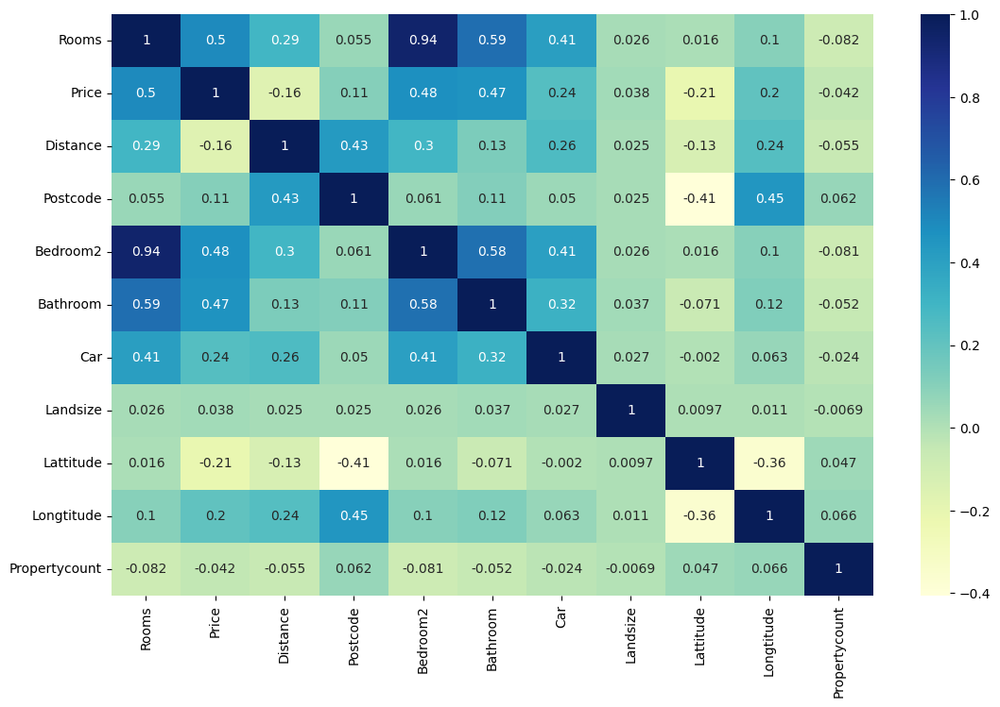

In [14]:
# Correlação entre variáveis
plt.figure(figsize=(13,8))
sns.heatmap(base.corr(),annot=True,cmap="YlGnBu")
plt.show()

In [15]:
# Escolhendo as que tem correlação mais alta e landsize pois retirei Building Area
base1 = base[["Price", "Rooms", "Bathroom", "Bedroom2", "Car", "Landsize"]]


In [16]:
# Verificando base tratada
base1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Price     13580 non-null  float64
 1   Rooms     13580 non-null  int64  
 2   Bathroom  13580 non-null  float64
 3   Bedroom2  13580 non-null  float64
 4   Car       13518 non-null  float64
 5   Landsize  13580 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 636.7 KB


In [17]:
base1 = base1.dropna(axis=0)

In [18]:
base1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13518 entries, 0 to 13579
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Price     13518 non-null  float64
 1   Rooms     13518 non-null  int64  
 2   Bathroom  13518 non-null  float64
 3   Bedroom2  13518 non-null  float64
 4   Car       13518 non-null  float64
 5   Landsize  13518 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 739.3 KB


In [19]:
base1.head()

,Price,Rooms,Bathroom,Bedroom2,Car,Landsize
0,1480000.0,2,1.0,2.0,1.0,202.0
1,1035000.0,2,1.0,2.0,0.0,156.0
2,1465000.0,3,2.0,3.0,0.0,134.0
3,850000.0,3,2.0,3.0,1.0,94.0
4,1600000.0,4,1.0,3.0,2.0,120.0


### Separando a variável que queremos prever (Price) e quais vão ser as colunas que vamos usar para essa previsão (X)

In [21]:
Y = base1.Price
X = base1.drop('Price', axis=1)

### Separando a base entre treino e **teste**

In [27]:
from sklearn.model_selection import train_test_split
x_treino,x_teste,y_treino,y_teste = train_test_split(X,Y)

### **Escolhendo um modelo pra usar**

In [28]:
# Importando modelo
from sklearn.linear_model import LinearRegression

#Instaciando
modelo_regressao = LinearRegression()

#Realizando o fit do modelo
modelo_regressao.fit(x_treino,y_treino)

#Usando modelo para prever dados de testes
y_regression = modelo_regressao.predict(x_teste)

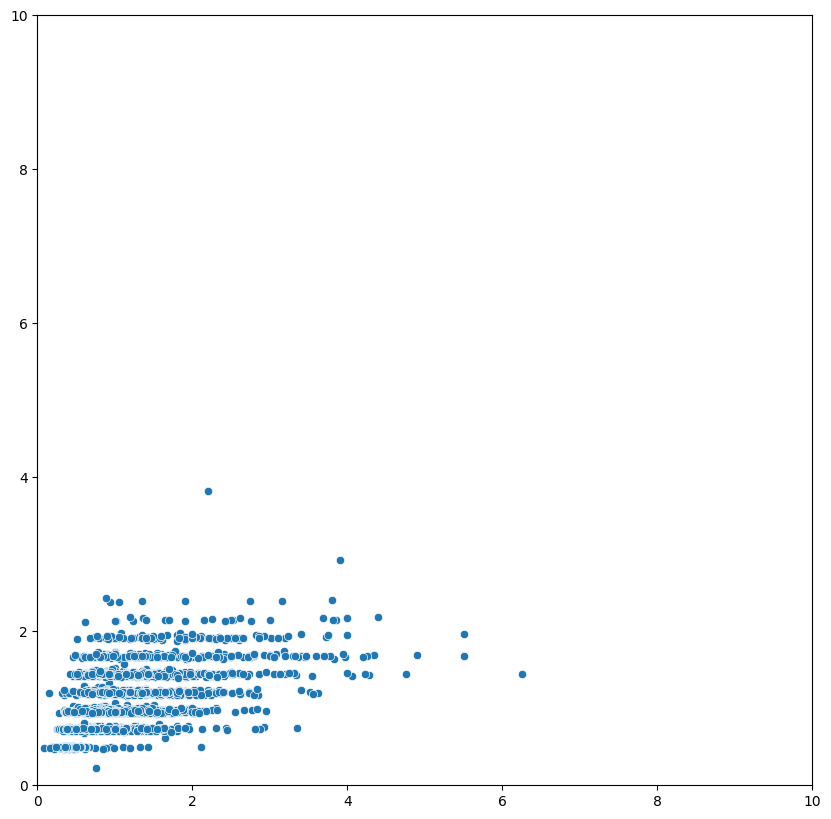

In [29]:
# Visualizando pontos previstos
plt.figure(figsize=(10,10))
sns.scatterplot(x=y_teste.values/1000000, y=y_regression/1000000)
plt.ylim(0, 10)
plt.xlim(0, 10)
plt.show()

In [30]:
# Avaliando o erro quadrático médio
from sklearn.metrics import mean_squared_error
erro_quadratico_regressao = mean_squared_error(y_teste, y_regression)
print(erro_quadratico_regressao)

285020601920.31464


In [31]:
# Avaliando o R quadrado
from sklearn.metrics import r2_score
r2_regressao = r2_score(y_teste,y_regression)
print(r2_regressao)

0.2800137661384978


### **Regressão linear: selecionando outras colunas**

In [33]:
# base1 = base[["Price", "Rooms", "Bathroom", "Bedroom2", "Car", "Landsize"]]
base2 = base[["Price", "Rooms", "Bathroom", "Bedroom2", "Car", "Longtitude", "Landsize", "Lattitude", "Distance", "Postcode", "Propertycount"]]

In [34]:
# Verificando valores nulos e trantando
base2 = base2.dropna(axis=0)
base2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13518 entries, 0 to 13579
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Price          13518 non-null  float64
 1   Rooms          13518 non-null  int64  
 2   Bathroom       13518 non-null  float64
 3   Bedroom2       13518 non-null  float64
 4   Car            13518 non-null  float64
 5   Longtitude     13518 non-null  float64
 6   Landsize       13518 non-null  float64
 7   Lattitude      13518 non-null  float64
 8   Distance       13518 non-null  float64
 9   Postcode       13518 non-null  float64
 10  Propertycount  13518 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 1.2 MB


In [38]:
# Separando base
Y = base2.Price
X = base2.drop("Price", axis=1)

#Dividindo em treino e teste
x_treino, x_teste, y_treino, y_teste = train_test_split(X,Y)

#Instaciando
modelo_regressao2 = LinearRegression()

#Fazendo o fit do modelo
modelo_regressao2.fit(x_treino, y_treino)

#Usando modelo para prever dados de testes
y_regressao2 = modelo_regressao2.predict(x_teste)

#Avaliando os erros

#Erro quadratico médio
erro_quadratico_regressao2 = mean_squared_error(y_teste, y_regressao2)
print(erro_quadratico_regressao2)

#R quadrado
r2_regressao2 = r2_score(y_teste,y_regressao2)
print(r2_regressao2)

196794323717.21463
0.4837786771826941


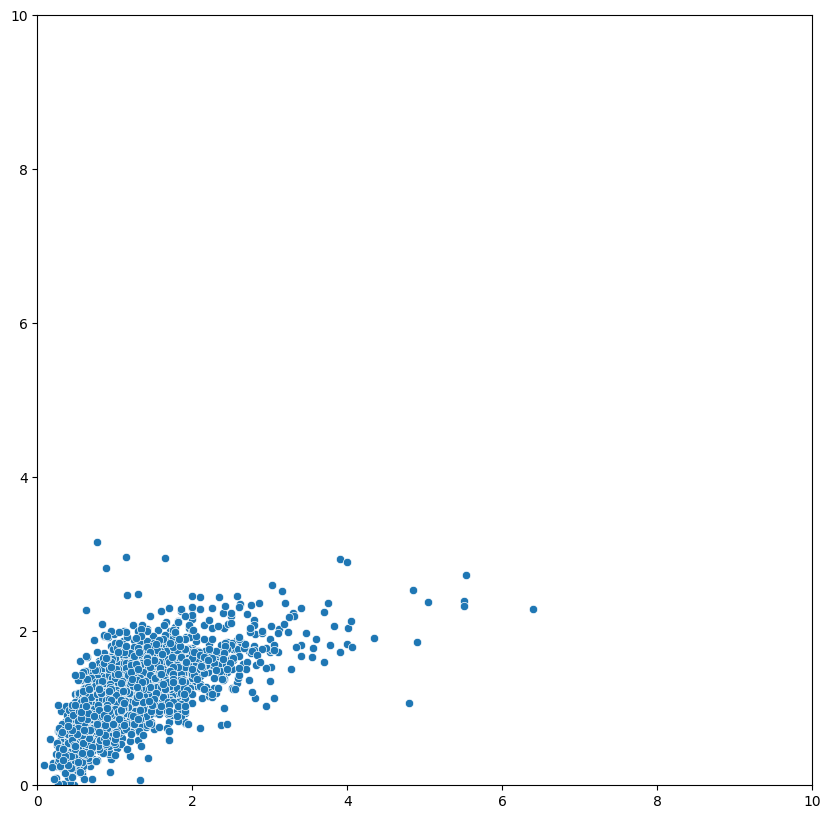

In [39]:
#Visualizando os pontos previstos
plt.figure(figsize=(10,10))
sns.scatterplot(x=y_teste.values/1000000, y=y_regressao2/1000000)
plt.ylim(0,10)
plt.xlim(0,10)
plt.show()

In [46]:
# Utilizando modelo de DecisionTreeRegressor
from sklearn.tree import DecisionTreeRegressor

# Instaciando
modelo_arvore_decisao = DecisionTreeRegressor()

#Realizando fit do modelo
modelo_arvore_decisao.fit(x_treino, y_treino)

#Usando o modelo para prever os dados de teste
y_arvore_decisao = modelo_arvore_decisao.predict(x_teste)

In [47]:
# Avaliando erros

#Erro quadratico médio
erro_quadratico_arvore_decisao = mean_squared_error(y_teste, y_arvore_decisao)
print(erro_quadratico_arvore_decisao)

#R quadrado
r2_arvore_decisao = r2_score(y_teste,y_arvore_decisao)
print(r2_arvore_decisao)

169992214484.64572
0.5540846698606747


## **Resumo dos resultados**

In [48]:
print('Regressão Linear')
print('Erro quadratico médio: ' + str(round(erro_quadratico_regressao,2)))
print('R quadrado: ' + str(round(r2_regressao,4)))
print('----------------------------------------------')
print('Regressão Linear: novas features')
print('Erro quadratico médio: ' + str(round(erro_quadratico_regressao2,2)))
print('R quadrado: ' + str(round(r2_regressao2,4)))
print('----------------------------------------------')
print('Árvore de Decisão')
print('Erro quadratico médio: ' + str(round(erro_quadratico_arvore_decisao,2)))
print('R quadrado: ' + str(round(r2_arvore_decisao,4)))

Regressão Linear
Erro quadratico médio: 285020601920.31
R quadrado: 0.28
----------------------------------------------
Regressão Linear: novas features
Erro quadratico médio: 196794323717.21
R quadrado: 0.4838
----------------------------------------------
Árvore de Decisão
Erro quadratico médio: 169992214484.65
R quadrado: 0.5541
